Using Hierarchical Clustering to organize and explore modern and ancient DNA data using G25 coordinates

In [1]:
require(rio)
require(tidyverse)
require(ggthemes)
require(pvclust)
require(ggdendro)
require(geomtextpath)

Loading required package: ggthemes

Loading required package: pvclust

Loading required package: ggdendro

Loading required package: geomtextpath



Load the data

In [365]:
myd = import("~/Documents/Ancestry/Genetics/G25/Data/TXT/By Age/Ancient_sampled.txt",fill = TRUE)
myd = myd %>% bind_rows(import("~/Documents/Ancestry/Genetics/G25/Data/TXT/By Age/Modern_Eurasia_sampled.txt",fill = TRUE))

In [366]:
ppl = as_tibble(import("~/Documents/Ancestry/Genetics/G25/Data/People/All.txt"))

In [367]:
myd %>% sample_n(15)

V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,⋯,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AUS_Mapoon_112BP:MH8,-0.038700,-0.229510,-0.213450,0.227716,0.138180,-0.336063,0.002585,0.003461,-0.009613,⋯,0.000530,-0.000913,0.004434,0.003520,0.002376,0.002745,-0.002226,0.004437,-0.003133,-0.005748
Spain_IA:I3327,0.124067,0.148267,0.050157,-0.017765,0.039392,-0.001952,-0.005170,0.005077,0.032315,⋯,0.023336,0.020210,0.004561,0.002263,0.002626,0.001123,-0.002102,-0.007148,0.000120,0.001078
SWE_Gotland_VA:VK469,0.134311,0.137096,0.076933,0.064600,0.043700,0.013108,-0.002585,0.015230,0.005113,⋯,-0.001856,-0.019818,0.000000,0.001383,0.006378,0.005865,-0.000371,0.005300,0.016508,-0.012693
Germany_SouthernGermany_Singen_IA:MX265,0.124067,0.144205,0.050534,0.026486,0.051086,-0.002510,0.004935,0.006231,0.006545,⋯,-0.016043,-0.009909,0.011529,0.005656,-0.003502,-0.011230,-0.008161,-0.005669,-0.010604,-0.004790
Germany_Lech_EBA:WEHR_1192SkB,0.116100,0.143190,0.066373,0.051357,0.041238,0.011435,0.003995,-0.000923,0.005113,⋯,-0.002652,0.000261,0.017610,0.006034,-0.008754,-0.000749,-0.000742,-0.005053,-0.001205,-0.011855
Czech:NA15728,0.134311,0.133034,0.057322,0.046835,0.033237,0.013945,0.007285,0.011769,0.007976,⋯,-0.003447,-0.000130,0.003294,0.010936,0.001376,0.005615,0.002968,0.010106,0.007832,0.002994
BedouinB:HGDP00623,0.037562,0.145221,-0.056945,-0.118542,-0.004924,-0.046296,-0.010340,-0.008307,0.054403,⋯,0.033280,-0.028033,0.001014,-0.004399,0.029389,0.014350,0.013725,-0.007395,0.002651,-0.015088
Italian_Campania:NaN195ST,0.109270,0.146236,-0.009051,-0.052003,0.012002,-0.018407,-0.002115,0.002769,0.002659,⋯,0.003315,0.019949,-0.004307,0.001131,-0.001126,0.003369,-0.000742,-0.001356,-0.000482,-0.000239
RUS_Lena_River_BA:irk061,0.046667,-0.370668,0.118039,0.028101,-0.115406,-0.052431,0.001175,-0.003461,0.015748,⋯,0.002519,-0.005085,-0.001140,0.005531,0.013632,-0.043798,0.024854,0.013804,-0.011929,-0.010538


Denormalize the sample identifiers

In [368]:
myd = myd %>% mutate(loc = str_extract(V1,"^\\w+?(?=_)"),
                     era = str_extract(V1,"(?<=_)\\w[^_]+?(?=[:.])"),
                     sample = str_extract(V1,"(?<=:)\\w+?(?=(_|\\.|$))"),
                     desc = paste(loc,era,sep = '_'),.before = V1)

In [369]:
myd %>% select(loc,era,sample,desc,V1) %>% sample_n(15)

loc,era,sample,desc,V1
<chr>,<chr>,<chr>,<chr>,<chr>
Russian,Smolensk,RUS,Russian_Smolensk,Russian_Smolensk:RUS_Smol304
Greek,Mani,NA,Greek_Mani,Greek_Deep_Mani:ARE-8
German,Erlangen,GSM1658613,German_Erlangen,German_Erlangen:GSM1658613
Lebanon,o2,NA,Lebanon_o2,Lebanon_Medieval_o2.SG:SI-47_noUDG.SG
Czech,EBA,I7196,Czech_EBA,Czech_EBA:I7196
Greek,Cappadocia,663,Greek_Cappadocia,Greek_Cappadocia:663
Czech,LaTene,I15042,Czech_LaTene,Czech_IA_LaTene:I15042
NA,NA,RO001,NA_NA,Romanian:RO001
Ashkenazi,Ukraine,Ashk,Ashkenazi_Ukraine,Ashkenazi_Ukraine:Ashk_UA_UA_11


Summarize and transpose

In [370]:
mydd = t(myd %>% select(-loc,-era,-sample,-V1) %>% group_by(desc) %>% summarize_all(median))

In [371]:
mydd = as_tibble(mydd)
colnames(mydd) = mydd[1,]
mydd %>% sample_n(10)

ALB_PostMA,ARM_Beniamin,ARM_EIA,ARM_LBA,ARM_LBA-EIA,ARM_MBA,AUS_112BP,AUT_Wels,Abkhasian_Gudauta,Albania_Modern,⋯,Ukrainian_Chernihiv,Ukrainian_Dnipro,Ukrainian_Lviv,Ukrainian_NA,Ukrainian_Rivne,Ukrainian_Sumy,Ukrainian_Zakarpattia,Ukrainian_Zhytomyr,Uppland_VA,Uppsala_VA
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
0.0085065,-0.0156175,0.0075300,0.0000000,-0.0009765,-0.0064140,-0.3360630,-0.0019520,-0.0058565,-0.0039040,⋯,0.0251000,0.0209170,0.0191040,-0.0161760,0.0209170,0.0242635,0.0170120,0.0211960,0.0220320,0.0298410
0.0025140,-0.0028285,0.0033310,-0.0021995,-0.0022000,0.0038970,0.0035200,-0.0061590,-0.0103075,0.0008800,⋯,0.0026400,0.0032680,0.0039595,0.0035200,0.0040220,0.0040850,0.0017600,0.0040220,0.0070390,0.0084220
0.0705795,0.1330345,0.1315110,0.1259260,0.1320185,0.1208480,-0.2295100,0.1472520,0.1218635,0.1431900,⋯,0.1218640,0.1198320,0.1310035,0.1421740,0.1238950,0.1223715,0.1269410,0.1249100,0.1198320,0.1228790
-0.0152685,-0.0046820,0.0057005,0.0070575,0.0057005,0.0122150,-0.0038000,0.0054290,0.0082110,-0.0158790,⋯,-0.0128930,-0.0093650,-0.0111290,-0.0020360,-0.0135720,-0.0112650,-0.0114010,-0.0093650,0.0152010,0.0080070
0.0138055,-0.0351780,-0.0553235,-0.0501085,-0.0448930,-0.0515400,-0.0096130,0.0055220,-0.0608460,0.0055220,⋯,-0.0020450,-0.0040900,0.0019430,0.0032720,0.0012270,0.0002045,-0.0012270,-0.0051130,0.0067490,0.0016360
-0.0002605,0.0115390,-0.0034550,0.0110825,-0.0017600,-0.0109520,-0.0009130,-0.0177320,0.0256855,0.0053460,⋯,0.0043030,0.0024770,-0.0093225,0.0032600,0.0022170,-0.0052805,0.0065190,0.0086050,-0.0260770,0.0010430
-0.0133870,-0.0340065,-0.0333905,-0.0267740,-0.0341600,-0.0261590,0.1381800,0.0295440,-0.0386225,0.0233890,⋯,0.0406230,0.0403150,0.0347755,0.0141560,0.0381610,0.0404690,0.0341600,0.0366220,0.0369300,0.0437000
0.0051150,0.0002435,0.0057645,0.0029230,0.0042220,0.0077950,-0.0100680,-0.0034100,0.0030850,0.0035730,⋯,-0.0035730,-0.0021110,-0.0060085,-0.0008120,-0.0030850,-0.0030045,-0.0019490,-0.0022730,-0.0074700,-0.0061710
-0.0013490,0.0044960,0.0055450,0.0017985,0.0020235,-0.0040460,-0.0019480,0.0049460,0.0133380,0.0046460,⋯,-0.0074930,-0.0092920,-0.0060695,0.0010490,-0.0074930,-0.0097415,-0.0076430,-0.0110900,-0.0089920,-0.0059950


Adding Y and mtDNA etc

In [374]:
ydata = as_tibble(import("~/Documents/Ancestry/Raw Data/Archeological Samples/aDNA-Y-mt/all-ancient-dna.xlsx"))

Warning message:
“Expecting numeric in AA1070 / R1070C27: got '...'”
Warning message:
“Expecting numeric in AA1476 / R1476C27: got '...'”
Warning message:
“Expecting numeric in AA1477 / R1477C27: got '...'”
Warning message:
“Expecting numeric in AO2887 / R2887C41: got '..'”
Warning message:
“Expecting numeric in AA4167 / R4167C27: got '...'”
Warning message:
“Expecting numeric in AO5085 / R5085C41: got '..'”
Warning message:
“Coercing text to numeric in AO7537 / R7537C41: '0.088'”
Warning message:
“Expecting numeric in AO8135 / R8135C41: got '..'”
Warning message:
“Expecting numeric in AO8222 / R8222C41: got '..'”
Warning message:
“Expecting numeric in AO8246 / R8246C41: got '..'”
Warning message:
“Expecting numeric in AO11704 / R11704C41: got '..'”
Warning message:
“Expecting numeric in AO11886 / R11886C41: got '..'”
Warning message:
“Coercing text to numeric in AO14505 / R14505C41: '0.778'”


In [378]:
ydata %>% sample_n(5)

Object-ID,Colloquial-Skeletal,Latitude,Longitude,Sex,mtDNA-coverage,mtFAR,mtDNA-haplogroup,mtDNA-Haplotree,mt-FTDNA,⋯,Location,SiteID,Country,LP,Skin,Hair,Eye,P1104A,Other,Index
<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<dbl>
BUL001,AT-923,46.28406,111.76826,M,NA,1.00000000,M11b,M11b,https://www.familytreedna.com/public/mt-dna-haplotree/M;name=M11b,⋯,"Bulgiin Ekh, Sukhbaatar",-,Mongolia,NA,NA,NA,NA,NA,NA,11059
Niuheliang3,NA,40.96331,119.02588,NA,NA,NA,NA,NA,NA,⋯,Niuheliang,NA,China,NA,NA,NA,NA,NA,NA,1986
HGH-1219,NA,53.87140,10.69000,M,NA,0.03175926,U4,U4,https://www.familytreedna.com/public/mt-dna-haplotree/U;name=U4,⋯,"Lübeck, Schleswig-Holstein",Heiligen-Geist-Hospital,Germany,NA,NA,NA,NA,NA,NA,14513
SALZ 24,NA,51.52000,11.85241,NA,NA,0.22868381,HV,HV,https://www.familytreedna.com/public/mt-dna-haplotree/R;name=HV,⋯,Salzmünde-Schiebzig,NA,Germany,NA,NA,NA,NA,NA,NA,1716
arm44,"Nerqin Naver-133, bur-1, ind-1; upper layer-037",40.29000,44.32000,NA,NA,0.43982533,U3b3,U3b3,https://www.familytreedna.com/public/mt-dna-haplotree/U;name=U3b3,⋯,Nerqin Naver,"133, bur-1, ind-1; upper layer-037",Armenia,NA,NA,NA,NA,NA,NA,4637


In [379]:
colnames(ydata)

[1] "Object-ID"           "Colloquial-Skeletal" "Latitude"           
 [4] "Longitude"           "Sex"                 "mtDNA-coverage"     
 [7] "mtFAR"               "mtDNA-haplogroup"    "mtDNA-Haplotree"    
[10] "mt-FTDNA"            "mtree"               "mt-YFull"           
[13] "FTDNA-mt-Haplotree"  "mt-Simple"           "mt-Symbol"          
[16] "HVS-I"               "HVS-II"              "HVS-NO"             
[19] "mt-SNPs"             "Responsible-mtDNA"   "Y-DNA"              
[22] "Y-New"               "SNP-positive"        "SNP-negative"       
[25] "SNP-dubious"         "NRY"                 "Y-FAR"              
[28] "Y-Simple"            "YTree"               "Y-Haplotree-Variant"
[31] "Y-Haplotree-Public"  "Y-FTDNA"             "YFull"              
[34] "Y-YFull"             "ISOGG2019"           "FTDNA-Y-Haplotree"  
[37] "Y-Symbol"            "Y-Symbol2"           "Responsible-SNP"    
[40] "SNPs"                "Autosomal-Coverage"  "Damage-Rate"        
[43] "Assessment"          "Kinship-Notes"       "Source"             
[46] "Method-Date"         "Date"                "Mean"               
[49] "CalBC_top"           "CalBC_bot"           "Age"                
[52] "Simplified_Culture"  "Culture_Grouping"    "Label"              
[55] "Location"            "SiteID"              "Country"            
[58] "LP"                  "Skin"                "Hair"               
[61] "Eye"                 "P1104A"              "Other"              
[64] "Index"

In [380]:
ydata = ydata %>% select(`Object-ID`,`Mean`,`Culture_Grouping`,`Simplified_Culture`,`Location`,`Country`,`Y-Symbol`,`YTree`)

In [381]:
myd = myd %>% inner_join(ydata,by = c("sample" = "Object-ID"))

Warning message in inner_join(., ydata, by = c(sample = "Object-ID")):
“Detected an unexpected many-to-many relationship between `x` and `y`.
ℹ Row 356 of `x` matches multiple rows in `y`.
ℹ Row 4282 of `y` matches multiple rows in `x`.
ℹ If a many-to-many relationship is expected, set `relationship =
  "many-to-many"` to silence this warning.”


In [383]:
colnames(myd)
myd %>% select(sample,desc,`Mean`,`Culture_Grouping`,`Simplified_Culture`,`Location`,`Country`,`Y-Symbol`,`YTree`) %>% sample_n(10)

[1] "loc"                "era"                "sample"            
 [4] "desc"               "V1"                 "V2"                
 [7] "V3"                 "V4"                 "V5"                
[10] "V6"                 "V7"                 "V8"                
[13] "V9"                 "V10"                "V11"               
[16] "V12"                "V13"                "V14"               
[19] "V15"                "V16"                "V17"               
[22] "V18"                "V19"                "V20"               
[25] "V21"                "V22"                "V23"               
[28] "V24"                "V25"                "V26"               
[31] "Mean"               "Culture_Grouping"   "Simplified_Culture"
[34] "Location"           "Country"            "Y-Symbol"          
[37] "YTree"

sample,desc,Mean,Culture_Grouping,Simplified_Culture,Location,Country,Y-Symbol,YTree
<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
AED249,Germany_o3,485,Alamannic,Germanic,Altenerding- Klettham,Germany,I,I1a
IKU001,Mongolia_LateMedieval,1350,Mongol,Mongol,"Ikh Uvgun, Umungobi",Mongolia,NA,NA
VK312,DNK_VA,875,Viking Denmark,Viking,Funen,Denmark,NA,NA
gun005,CanaryIslands_Guanche,958,Guanche_mummy,Canarias_Guanche,Gran Canaria,Spain,NA,NA
ALN009,Kyrgyzstan_IA,250,Alai_Nura_300CE,Steppe_Central_Nomad_MA,"Alai / Nura I, II, Tuyuk II Burials #360/14",Kyrgyzstan,NA,NA
VK426,SWE_VA,1050,Viking Sweden,Viking,Skara,Sweden,R1b,R1b-M269
BUR004,Mongolia_NA,10,Late Xiongnu,Xiongnu,"Tamiryn Ulaan Khoshuu (Burkhan Tolgoi), Arkhangai",Mongolia,NA,NA
I12878,Spain_IA,-410,Iberian culture,Iberia_IA,"Mas d'en Boixos-1, Pacs del Penedès, Barcelona, Catalonia",Spain,NA,NA
I4067,Netherlands_BellBeaker,-1820,BK_Netherlands_Tui,Bell_Beaker,"De Tuithoorn, Oostwoud, Noord-Holland",The Netherlands,NA,NA


In [384]:
myd = myd %>% mutate(yc = paste(Country,`Y-Symbol`,sep = "_"),y = ifelse(is.na(`Y-Symbol`),'??',`Y-Symbol`),
                     sample = paste(Simplified_Culture,Location,sep = ":"))

Automating the process

In [271]:
options(repr.plot.width = 12, repr.plot.height = 12, repr.plot.res = 400)

In [91]:
mydfun = function(somedata,variable) {
    myvars = c(variable,paste0("V",2:26))
    mydd = as_tibble(t(somedata %>% select(all_of(myvars)) %>% group_by(.data[[variable]]) %>% summarize_all(median)))
    colnames(mydd) = mydd[1,]
    mydd %>% head
    return(mydd[2:nrow(mydd),])
}

In [402]:
myfun = function(somedata,size = 2,polar = TRUE,sbst = FALSE) {
    mydd = as_tibble(somedata)
    myfit = pvclust(mydd,method.hclust = "complete",method.dist = "euclidean",nboot = 10)
    ddata = dendro_data(myfit$hclust,type = "rectangle",uniform = TRUE,compress = TRUE)
    #print(summary(ddata$segments))
    #print(summary(ddata$labels))
    sdata = segment(ddata) 
    ldata = label(ddata)
    if (sbst) {ldata = ldata %>% dplyr::filter(x%%5 == sample(0:4,1))}
    myclr = "gray10"
    p = ggplot(sdata) + 
        geom_segment(aes(x = x,y = y,xend = xend,yend = yend),color = "wheat",size = 0.25,alpha = 0.5) + 
        geom_textvline(data = ldata,aes(xintercept = x,label = label,color = label),size = size,linetype = 0,hjust = ifelse(polar,1.1,0.01)) + 
        scale_color_viridis_d(option = "C") + 
        guides(color = "none") +  
        theme_void() + 
        theme(panel.background = element_rect(fill = myclr,color = myclr)) + 
        theme(plot.background = element_rect(fill = myclr,color = myclr))
    ifelse(polar,print(p + scale_y_reverse(expand = c(0.3,0)) + coord_curvedpolar()),
           print(p + scale_y_continuous(expand = c(0.175,0)) + coord_flip()))
    return(myfit)
}

In [385]:
colnames(myd)

[1] "loc"                "era"                "sample"            
 [4] "desc"               "V1"                 "V2"                
 [7] "V3"                 "V4"                 "V5"                
[10] "V6"                 "V7"                 "V8"                
[13] "V9"                 "V10"                "V11"               
[16] "V12"                "V13"                "V14"               
[19] "V15"                "V16"                "V17"               
[22] "V18"                "V19"                "V20"               
[25] "V21"                "V22"                "V23"               
[28] "V24"                "V25"                "V26"               
[31] "Mean"               "Culture_Grouping"   "Simplified_Culture"
[34] "Location"           "Country"            "Y-Symbol"          
[37] "YTree"              "yc"                 "y"

In [386]:
mydd = mydfun(myd,"sample")

If we want to add individuals to this

In [387]:
mydd = mydd %>% bind_cols(ppl %>% mutate(sample = str_extract(V1,"^\\w+(?=:)"),.before = V1) %>% mydfun("sample"))

Bootstrap (r = 0.48)... Done.
Bootstrap (r = 0.6)... Done.
Bootstrap (r = 0.68)... Done.
Bootstrap (r = 0.8)... Done.
Bootstrap (r = 0.88)... Done.
Bootstrap (r = 1.0)... Done.
Bootstrap (r = 1.08)... Done.
Bootstrap (r = 1.2)... Done.
Bootstrap (r = 1.28)... Done.
Bootstrap (r = 1.4)... Done.


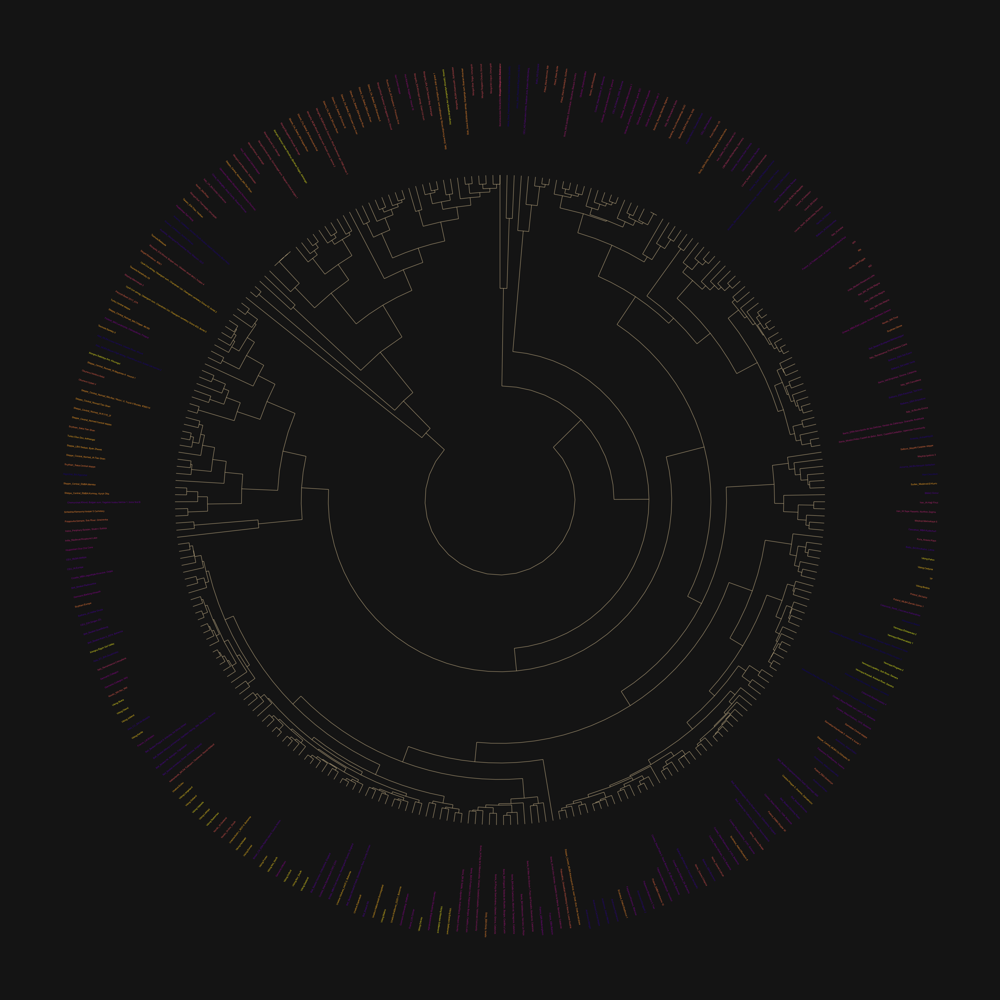

In [405]:
myfit = myfun(mydd,size = 0.7,polar = TRUE)

In [406]:
ggsave("~/Desktop/plot.pdf",width = 12,height = 12,dpi = 400)

How good is the fit?

In [82]:
round(myfit$edges$au,2)

[1] 1.00 1.00 0.95 0.95 0.83 1.00 0.90 0.99 0.64 0.73 0.48 1.00 0.99 0.99 0.84
 [16] 1.00 0.83 0.84 0.99 0.78 0.88 0.96 1.00 0.93 0.96 0.94 0.97 0.89 0.94 0.79
 [31] 0.99 0.62 0.76 0.79 0.82 0.64 0.80 0.81 0.91 1.00 0.98 1.00 0.99 0.87 0.94
 [46] 0.91 0.84 0.95 0.91 0.97 0.97 0.94 0.86 0.89 0.96 0.88 0.65 0.83 0.84 0.97
 [61] 0.78 0.85 0.82 1.00 0.92 0.60 0.91 0.76 0.98 0.97 0.93 0.91 0.93 0.86 0.67
 [76] 0.96 0.97 0.97 0.25 0.86 0.88 0.63 0.80 0.41 0.80 0.78 0.89 0.82 0.86 0.95
 [91] 0.00 0.81 0.90 0.97 0.93 0.57 0.92 0.95 0.49 0.97 0.95 0.90 0.79 0.97 0.92
[106] 0.85 0.91 0.96 0.90 0.78 0.93 0.91 0.97 0.96 0.91 0.99 0.96 0.95 0.00 0.66
[121] 0.99 0.92 0.91 0.69 0.00 0.98 1.00 0.91 0.86 0.90 1.00

In [77]:
with(myfit$hclust,labels[order])

[1] "Africa_East_Pastoralist"   "Iberomaurusian"           
  [3] "CEU_HG"                    "Baltic_HG"                
  [5] "Pitted_Ware"               "Anatolia_IA"              
  [7] "Iran_IA"                   "Levant_South_MLBA"        
  [9] "Caucasus_MBA"              "Kura_Araxes"              
 [11] "Saltovo_Mayaki"            "Maykop"                   
 [13] "Armenia_MLBA"              "Alan"                     
 [15] "Sudan_Medieval"            "Iberia_MLN"               
 [17] "Nordic_MN"                 "Globular_Amphora"         
 [19] "Globular_Amphora_Zlota"    "CEU_N"                    
 [21] "Sicily_EBA"                "Sardinia_Nuragic"         
 [23] "Italy_BA"                  "Sardinia_Punic"           
 [25] "Sardinia_EBA"              "Anglian"                  
 [27] "CEU_MN"                    "Balkans_BA"               
 [29] "France_LIA"                "Germanic"                 
 [31] "Asia_CC_BA"                "Asia_EC_BIA"              
 [33] "CEU_EIA"                   "Croatia_MBA"              
 [35] "CEU_IA"                    "CEU_MLBA"                 
 [37] "Iberia_BA"                 "Iberia_IA"                
 [39] "France_EBA"                "France_LBA"               
 [41] "Greece_MBA"                "Balkans_IA"               
 [43] "Nordic_MA"                 "Scythian"                 
 [45] "Iberia_EMA"                "Iberia_Muslim"            
 [47] "Balkans_EBA"               "Iberia_Hel"               
 [49] "Italy_Renaissance"         "Canarias_Guanche"         
 [51] "Britain_Roman"             "Levant_IA"                
 [53] "Levant_BA"                 "Levant_North_MLBA"        
 [55] "Levant_North_EMBA"         "Anatolia_East_EBA"        
 [57] "Anatolia_BA"               "Anatolia_EBA"             
 [59] "Iron_Gates_HG_EN"          "LBK"                      
 [61] "Punic"                     "Apulia_IA"                
 [63] "France_LN"                 "Italy_LMA"                
 [65] "Italy_MA_M"                "Italy_MA"                 
 [67] "India_Modern"              "Italy_IA"                 
 [69] "Okunevo"                   "Sargat"                   
 [71] "Pazyryk"                   "Tasmola"                  
 [73] "Uyuk"                      "Mongolia_EIA"             
 [75] "Steppe_Central_Nomad_MA"   "Altai_MLBA"               
 [77] "Xiongnu"                   "India_Medieval"           
 [79] "Indus_Periphery"           "Aigyrzhal_BA"             
 [81] "BMAC"                      "Potapovka"                
 [83] "Sintashta"                 "Chemurchek"               
 [85] "Steppe_Central_EMBA"       "Sarmatian"                
 [87] "Scythian_Saka"             "Steppe_Central_Nomad"     
 [89] "Steppe_Central_MLBA"       "Andronovo_Alakul"         
 [91] "Srubnaya_Alakul"           "Andronovo"                
 [93] "Fatyanovo"                 "Corded_Ware"              
 [95] "Niche_Graves"              "Catacomb_North_Caucasus"  
 [97] "Catacomb"                  "Afanasievo"               
 [99] "Yamnaya"                   "Baltic_BA"                
[101] "Poland_BA"                 "Poland_MLBA"              
[103] "Poland_EBA"                "Poland_EMBA"              
[105] "Bell_Beaker"               "Unetice"                  
[107] "Nordic_IA"                 "Viking"                   
[109] "Netherlands_BA"            "Britain_CA_EBA"           
[111] "Britain_MBA"               "Palaeolithic_Gravettian"  
[113] "Finland_MIA"               "Turkic"                   
[115] "Steppe_Central_Nomad_IA"   "Steppe_LBA"               
[117] "America_Caribbean_Archaic" "Australia_Aboriginal"     
[119] "Hoabinhian"                "Taiwan_EIA"               
[121] "Siberia_Cis_Baikal_MA"     "China_IA"                 
[123] "Italy_CA_BA"               "Russia_East_IA"           
[125] "Hun"                       "Mongolia_MLBA"            
[127] "Hun_Sarmatian"             "Mongol"                   
[129] "Siberia_Cis_Baikal_BA"     

In [36]:
colnames(myd)

[1] "loc"                "era"                "sample"            
 [4] "desc"               "V1"                 "V2"                
 [7] "V3"                 "V4"                 "V5"                
[10] "V6"                 "V7"                 "V8"                
[13] "V9"                 "V10"                "V11"               
[16] "V12"                "V13"                "V14"               
[19] "V15"                "V16"                "V17"               
[22] "V18"                "V19"                "V20"               
[25] "V21"                "V22"                "V23"               
[28] "V24"                "V25"                "V26"               
[31] "Mean"               "Simplified_Culture" "Location"          
[34] "Country"            "Y-Symbol"           "YTree"             
[37] "yc"                 "y"

In [90]:
write_csv(myd %>% select(all_of(c("sample","desc","Simplified_Culture","Country","Location","y",paste0("V",2:26)))) %>% arrange(sample),"~/Documents/Ancestry/Raw Data/Archeological Samples/aDNA++.csv")

In [37]:
myd %>% count(Simplified_Culture,sort = TRUE) %>% head()

,Simplified_Culture,n
,<chr>,<int>
1,Viking,79
2,Bell_Beaker,22
3,Corded_Ware,14
4,Mongol,13
5,Italy_MA,12
6,Xiongnu,12


In [38]:
mavg = as_tibble(import("/Users/timoha/Documents/Ancestry/Genetics/G25/Data/TXT/Global25_PCA_modern_pop_averages_scaled.txt"))

In [39]:
mavg %>% sample_n(10)

V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,⋯,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Chamalin,0.1123745,0.1082924,-0.0248901,0.0117748,-0.0428051,0.0148065,0.0116652,-0.0032725,-0.0616546,⋯,-0.0023264,0.0040656,-0.0040194,-0.0058964,0.0038314,0.0013500,0.0027092,0.0080223,0.0097493,-0.0008711
Mayan,0.0567490,-0.2949387,0.1107659,0.0902554,-0.1048547,-0.0156974,-0.2758356,-0.3286347,-0.0140829,⋯,0.0037504,0.0079163,-0.0009773,-0.0013466,-0.0019474,-0.0026024,0.0056176,0.0010037,0.0000344,0.0003594
Greek_Izmir,0.1146199,0.1443068,-0.0024135,-0.0345287,0.0149874,-0.0126059,0.0025145,-0.0015000,-0.0022907,⋯,0.0001989,0.0107827,-0.0001141,0.0059203,-0.0030515,-0.0060393,0.0019289,0.0002095,0.0023496,-0.0030056
German_Hamburg,0.1282853,0.1339901,0.0634672,0.0485260,0.0400617,0.0203755,0.0075618,0.0091083,0.0029597,⋯,0.0032679,-0.0045558,0.0025562,0.0039926,0.0006842,0.0017395,0.0015566,0.0027185,0.0073504,-0.0010354
Saliya_Kerala,0.0443910,-0.0751490,-0.1644250,0.1052990,-0.0738600,0.0571730,-0.0007050,0.0177680,0.0370190,⋯,-0.0022540,-0.0026080,0.0017740,-0.0018850,-0.0003750,0.0082350,0.0000000,0.0038210,-0.0065070,0.0063470
Polish,0.1318405,0.1292694,0.0698685,0.0577382,0.0406754,0.0217127,0.0086781,0.0108626,-0.0009329,⋯,-0.0005595,0.0015455,-0.0000741,0.0026948,0.0012872,-0.0031286,-0.0031185,0.0056063,-0.0033328,-0.0000876
Brahmin_Uttar_Pradesh_East,0.0671557,-0.0287249,-0.1255811,0.1099131,-0.0729366,0.0631489,0.0006379,0.0081756,0.0258869,⋯,0.0006250,-0.0049920,0.0020630,-0.0039146,-0.0104693,-0.0019966,-0.0001060,0.0031164,0.0043723,-0.0076639
Aymara,0.0569120,-0.3127830,0.1191700,0.0930240,-0.1147910,-0.0145020,-0.3015190,-0.3592930,-0.0096130,⋯,0.0034470,0.0069100,0.0002530,-0.0017600,0.0025010,-0.0014970,0.0040810,0.0036970,0.0003610,-0.0075440
Palestinian_Beit_Sahour,0.0876435,0.1467440,-0.0541165,-0.0849490,-0.0156955,-0.0231480,-0.0054050,-0.0050765,0.0117600,⋯,0.0144525,0.0098440,0.0019635,-0.0001255,-0.0011255,-0.0016845,0.0038950,0.0035125,0.0053620,0.0033525


In [40]:
mavg = mydfun(mavg,"V1")

In [41]:
mavg %>% head(10)

Abazin,Abkhasian,Abkhasian_Gudauta,Adygei,Aeta,Afrikaner,Agta,Ahiska,Akha,Akhvakh,⋯,Yemenite_Mahra,Yi,Yoruba,Yugur,Yukagir_Forest,Yukagir_Tundra,Yukpa,Yuku,Zapotec,Zhuang
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Abazin,Abkhasian,Abkhasian_Gudauta,Adygei,Aeta,Afrikaner,Agta,Ahiska,Akha,Akhvakh,⋯,Yemenite_Mahra,Yi,Yoruba,Yugur,Yukagir_Forest,Yukagir_Tundra,Yukpa,Yuku,Zapotec,Zhuang
0.1079895,0.1092703,0.1109775,0.1128114,-0.0165040,0.1158925,-0.0210570,0.1115467,0.0163146,0.1166687,⋯,0.0542556,0.0201087,-0.6300625,0.0275310,0.0858226,0.0404072,0.0546350,0.0346022,0.0539522,0.0174529
0.0755300,0.1166731,0.1218635,0.1033583,-0.3330935,0.1294338,-0.3315700,0.1293107,-0.4336311,0.1068846,⋯,0.1360809,-0.4393857,0.0625011,-0.4163672,-0.1387214,-0.4049061,-0.3158300,-0.3748996,-0.2983626,-0.4492026
-0.0231456,-0.0478942,-0.0494025,-0.0297507,-0.0923945,0.0524198,-0.0956000,-0.0519170,-0.0206411,-0.0218100,⋯,-0.0682589,-0.0072910,0.0221130,0.0112194,0.1010680,0.1285711,0.1112510,0.0202640,0.1125328,-0.0364969
-0.0175631,-0.0406621,-0.0369835,-0.0192364,0.0332690,0.0390096,0.0342380,-0.0485577,-0.0504526,0.0188147,⋯,-0.1211978,-0.0485577,0.0167079,-0.0554349,0.0299098,-0.0016381,0.0994840,-0.0395244,0.0919258,-0.0660356
-0.0323136,-0.0389473,-0.0386225,-0.0334420,0.1041730,0.0370557,0.1044810,-0.0333393,0.0812767,-0.0406229,⋯,-0.0037272,0.0544713,0.0005035,0.0371222,-0.0431462,-0.1307937,-0.1110980,0.0104019,-0.1038348,0.1187230
0.0003835,-0.0065696,-0.0058565,-0.0020761,-0.0065540,0.0149967,-0.0139445,-0.0099470,0.0360884,0.0127360,⋯,-0.0563050,0.0194290,0.0124741,0.0147812,-0.0209168,-0.0729101,-0.0206380,0.0043972,-0.0159524,0.0559021
0.0081666,0.0113851,0.0110455,0.0091653,0.0023500,0.0038134,0.0001175,0.0050133,0.0008930,0.0052484,⋯,-0.0130301,0.0025850,-0.0444170,0.0064921,0.0127848,0.0043477,-0.3045740,0.0085464,-0.2672540,-0.0010575
-0.0031151,-0.0063329,-0.0042690,-0.0032051,-0.0139605,0.0064823,-0.0091150,-0.0066150,-0.0035383,-0.0025768,⋯,-0.0088204,-0.0001540,0.0477673,0.0017163,0.0231682,0.0111589,-0.3636770,0.0053614,-0.3242634,-0.0083203


[1]  25 856
# A tibble: 6 × 856
  Abazin   Abkhasian Abkhasian_Gudauta Adygei Aeta  Afrikaner Agta  Ahiska Akha 
  <chr>    <chr>     <chr>             <chr>  <chr> <chr>     <chr> <chr>  <chr>
1 " 0.107… " 0.1092… " 0.1109775"      " 0.1… "-0.… " 0.1158… "-0.… " 0.1… " 0.…
2 " 0.075… " 0.1166… " 0.1218635"      " 0.1… "-0.… " 0.1294… "-0.… " 0.1… "-0.…
3 "-0.023… "-0.0478… "-0.0494025"      "-0.0… "-0.… " 0.0524… "-0.… "-0.0… "-0.…
4 "-0.017… "-0.0406… "-0.0369835"      "-0.0… " 0.… " 0.0390… " 0.… "-0.0… "-0.…
5 "-0.032… "-0.0389… "-0.0386225"      "-0.0… " 0.… " 0.0370… " 0.… "-0.0… " 0.…
6 " 0.000… "-0.0065… "-0.0058565"      "-0.0… "-0.… " 0.0149… "-0.… "-0.0… " 0.…
# ℹ 847 more variables: Akhvakh <chr>, Alawite <chr>, Albanian <chr>,
#   Alevi_Dersim <chr>, Algerian <chr>, Altaian <chr>, Amerindian_North <chr>,
#   Ami <chr>, Andian_A <chr>, Andian_B <chr>, Arain <chr>,
#   Armenian_Aintab <chr>, Armenian_Ararat <chr>, Armenian_Artsakh <chr>,
#   Armenian_Erzurum <chr>, Armenian_

x,y,xend,yend
<dbl>,<dbl>,<dbl>,<dbl>
165.90388,1.10867401,47.85533,1.10867401
47.85533,1.10867401,47.85533,0.74460198
47.85533,0.74460198,15.96066,0.74460198
15.96066,0.74460198,15.96066,0.56918529
15.96066,0.56918529,4.59375,0.56918529
4.59375,0.56918529,4.59375,0.23305611
4.59375,0.23305611,1.50000,0.23305611
1.50000,0.23305611,1.50000,0.12127535
1.50000,0.12127535,1.00000,0.12127535


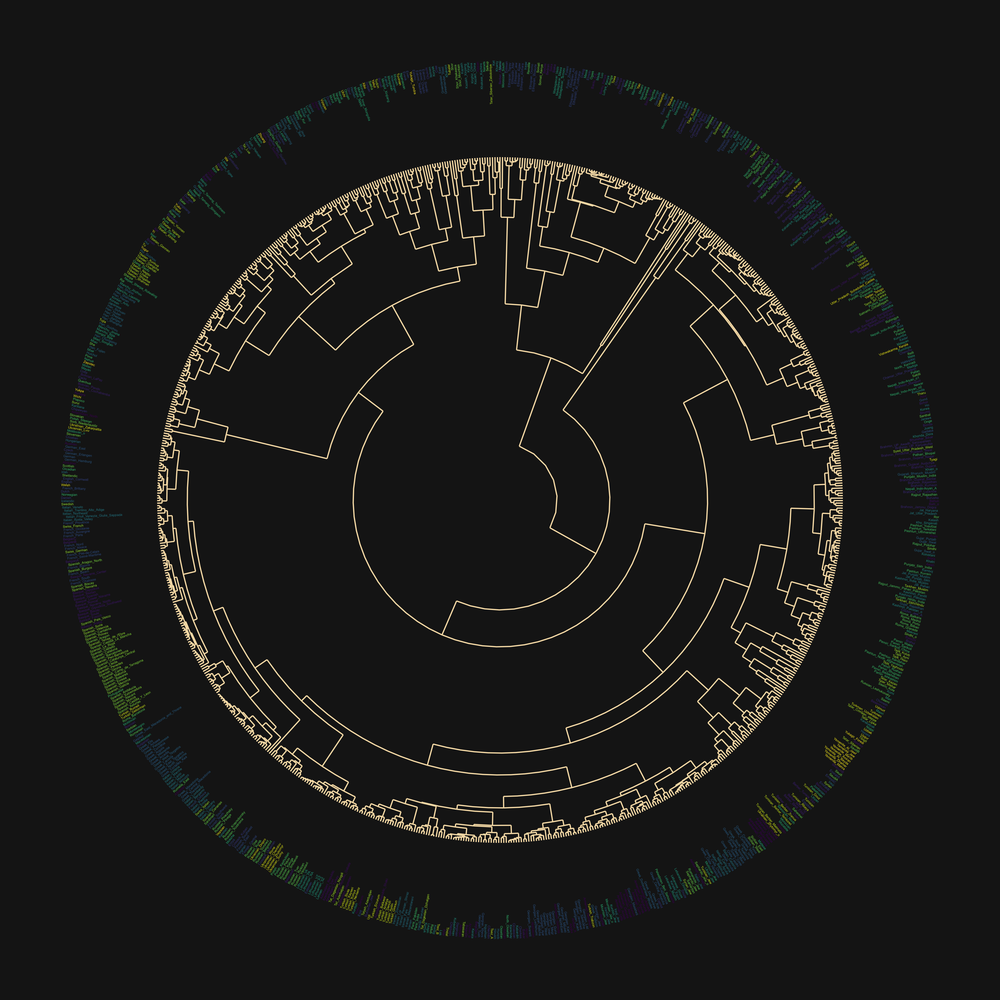

In [47]:
myfun(mavg[2:nrow(mavg),],1)

In [48]:
ggsave("~/Desktop/plot.pdf",width = 12,height = 12,dpi = 400)